In [23]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import f_oneway
from scipy.cluster.hierarchy import linkage, dendrogram


def violin(results_df):
    
    for divergence in ["JS Divergence", "KL Divergence", "GJS Divergence", "SGJS Divergence"]:
        plt.figure(figsize=(12, 6)) 
        sns.violinplot(x="Context", y=divergence, data=results_df, hue="Sample", palette="colorblind")
        plt.title(f"{divergence} by Context and Sample")
        plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

    
    plt.show()
        

def heatmap(results_df):

    # Heatmaps
    for divergence in ["JS Divergence", "KL Divergence", "GJS Divergence", "SGJS Divergence"]:
        pivot_df = results_df.pivot_table(
            index='Sample', columns='Context', values=divergence, fill_value=0
        )
        plt.figure(figsize=(12, 8))
        sns.heatmap(pivot_df, annot=False, cmap="RdBu_r")  # Use diverging colormap
        plt.title(f"{divergence} Heatmap")

        plt.show()


divergences = ["JS Divergence", "KL Divergence", "GJS Divergence", "SGJS Divergence"]


def scatterplot_with_marginals(results_df):
    """Creates scatterplots with marginal distributions for each pair of divergence measures."""

    g = sns.PairGrid(results_df, vars=divergences, hue="Context", palette="colorblind")

    # Scatterplot in the main diagonal
    g.map_diag(sns.histplot, kde=True)

    # Scatterplot in the upper triangle
    g.map_upper(sns.scatterplot)

    # Density plots in the lower triangle
    g.map_lower(sns.kdeplot)

    # Add legend
    g.add_legend()
    plt.show()




In [2]:
path = "/shares/grossniklaus.botinst.uzh/eharputluoglu/calculation_output/methylation_analysis_results_Smooting_1e-10.csv"

results_df = pd.read_csv(path)

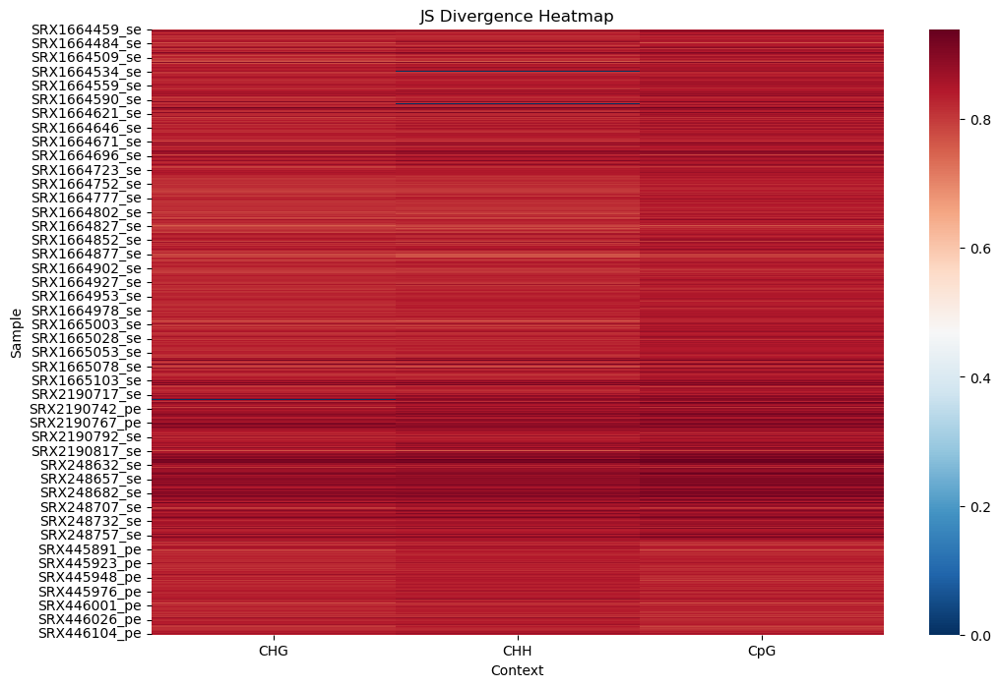

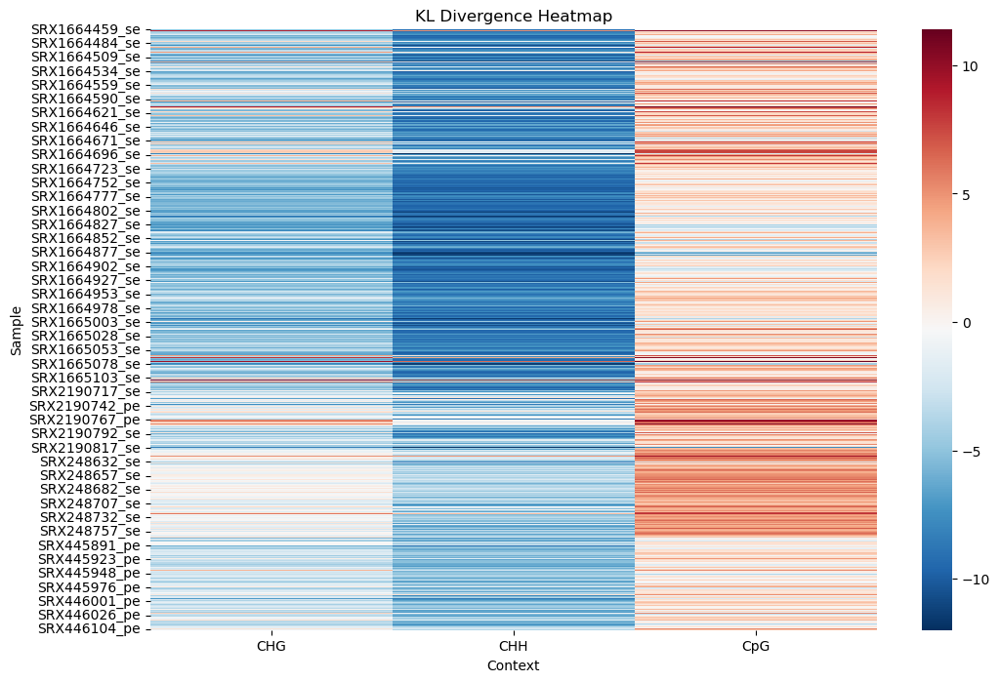

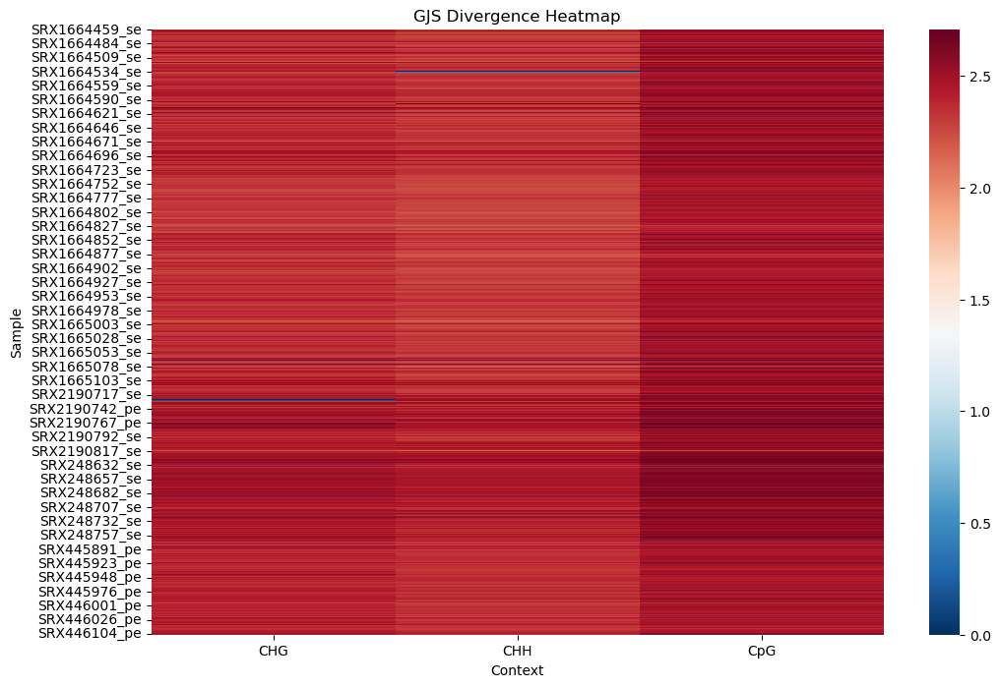

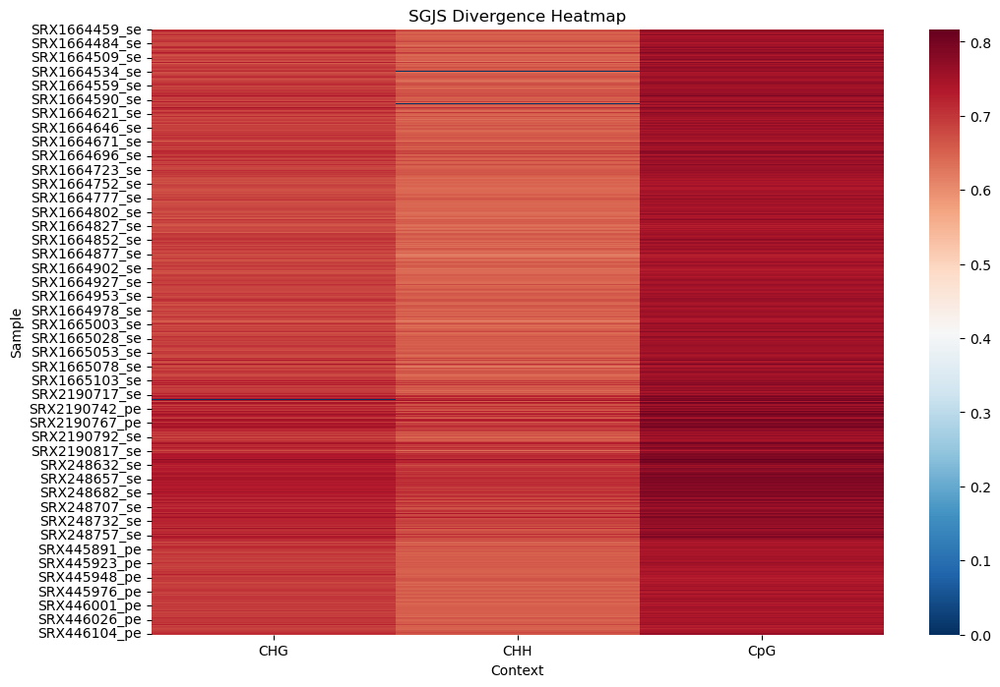

In [26]:
heatmap(results_df)

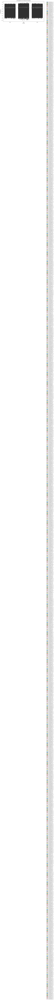

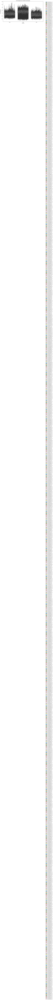

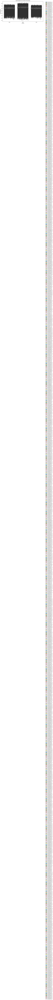

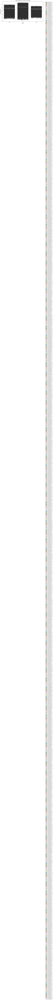

In [13]:
violin(results_df)

/home/eharpu/data/conda/envs/environment_shannon/lib/python3.12/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/eharpu/data/conda/envs/environment_shannon/lib/python3.12/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/home/eharpu/data/conda/envs/environment_shannon/lib/python3.12/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/ho

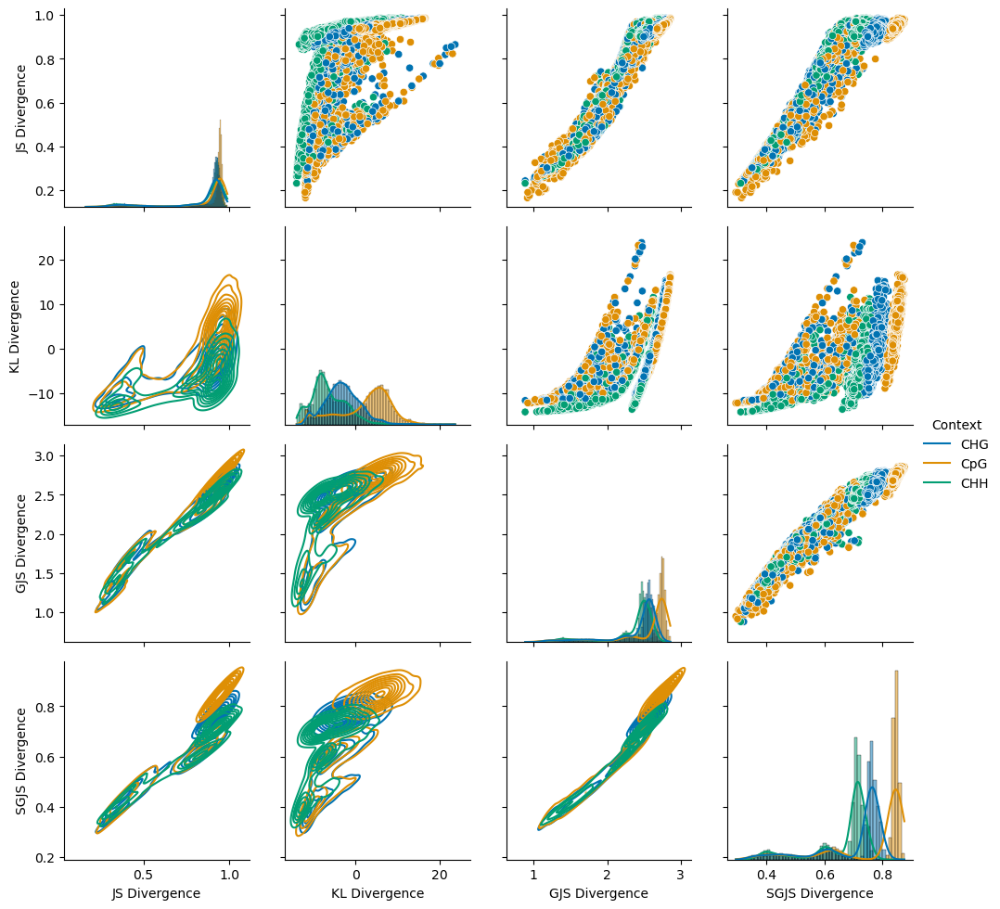

In [15]:
scatterplot_with_marginals(results_df)

In [29]:
results_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 22568 entries, 0 to 22567
Data columns (total 9 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Sample           22568 non-null  object 
 1   Chromosome       22568 non-null  object 
 2   Context          22568 non-null  object 
 3   JS Divergence    22568 non-null  float64
 4   KL Divergence    22568 non-null  float64
 5   GJS Divergence   22568 non-null  float64
 6   SGJS Divergence  22568 non-null  float64
 7   KS Statistic     22568 non-null  float64
 8   KS P-value       22568 non-null  float64
dtypes: float64(6), object(3)
memory usage: 1.5+ MB


In [19]:
results_df[results_df["Sample"] == "SRX1664459_se"]

,Sample,Chromosome,Context,JS Divergence,KL Divergence,GJS Divergence,SGJS Divergence,KS Statistic,KS P-value
19236,SRX1664459_se,1,CHH,0.921759,-8.983381,2.461591,0.702155,0.941708,0.0
19237,SRX1664459_se,4,CpG,0.933840,2.844596,2.701197,0.838934,0.596445,0.0
19238,SRX1664459_se,5,CHH,0.914968,-9.416616,2.451888,0.704236,0.934825,0.0
19239,SRX1664459_se,4,CHH,0.911090,-8.934292,2.451442,0.705378,0.927079,0.0
19240,SRX1664459_se,3,CpG,0.940637,3.680133,2.717697,0.839366,0.623941,0.0
19241,SRX1664459_se,1,CpG,0.944186,3.023130,2.710566,0.834503,0.674687,0.0
19242,SRX1664459_se,Pt,CHG,0.342795,-9.228625,1.444753,0.412606,0.970297,0.0
19243,SRX1664459_se,5,CHG,0.912381,-4.950273,2.526504,0.751997,0.876803,0.0
19244,SRX1664459_se,Mt,CHH,0.764535,-8.281746,2.226742,0.591207,0.962554,0.0
19245,SRX1664459_se,3,CHH,0.917524,-8.340449,2.471724,0.708230,0.931090,0.0
